In [1]:
import numpy as np
import seaborn as sns
from copy import deepcopy
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

## Zadanie 1 Sumowanie liczb pojedynczej precyzji

 ##### 1. Napisz program, który oblicza sumę N liczb pojedynczej precyzji przechowywanych w tablicy o N = 10^7 elementach. Tablica wypełniona jest tą samą wartością v z  przedziału [0.1, 0.9] np. v = 0.53125.

In [2]:
v = np.random.uniform(low=0.1, high=0.9)
A = np.full(dtype=np.float32, shape=10**7, fill_value=v)
A

array([0.7674047, 0.7674047, 0.7674047, ..., 0.7674047, 0.7674047,
       0.7674047], dtype=float32)

In [3]:
def normal_sum(A):
    acc=np.float32(0) # wymuszam tak pojedynczą precycję, acc=0 dałoby podwójną precyzję
    for x in A:
        acc+=x
    return acc

In [4]:
sum1 = normal_sum(A)
sum1

8623120.0

##### 2. Wyznacz bezwzględny i względny błąd obliczeń. Dlaczego błąd względny jest tak duży?


In [5]:
dif = sum1/10**7 - v
print("Błąd: ", dif)
print("Błąd względny: ", dif/v)

Błąd:  0.09490733673000917
Błąd względny:  0.12367313006100221


Błąd jest bardzo duży, bo dodając liczby w ten sposób narażamy się na duże błędy przybliżeń. Tym istotniejsze, im większą wartość ma nasza zmienna sumy/akumulatora w porównaniu do dodawanych do niej elementów tablicy

##### 3. W jaki sposób rośnie błąd względny w trakcie sumowania? Przedstaw wykres (raportuj wartość błędu co 25000 kroków) i dokonaj jego interpretacji.

In [6]:
X = []
Y = []

acc = np.float32(0)
i = 0
j = 0
while i<10**7:
    while j<25000:
        acc+=A[i]
        
        i+=1
        j+=1
    j=0
    X.append(i)
    Y.append((acc/i-v)/v) 

<AxesSubplot:>

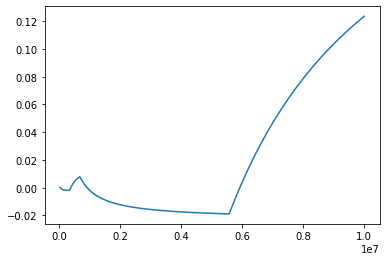

In [7]:
sns.lineplot(x=X, y=Y)

Błąd raz rośnie, raz maleje - zależnie czy akurat przez błędy przybliżeń niedoszacowujemy czy przeszacowujemy wynik dodawania. W każdym razie, sumować kończymy na solidnym błędzie. Wygląd wykresu zależy od wylosowanej wartości v.

##### 4. Zaimplementuj rekurencyjny algorytm sumowania, działający jak na rysunku poniżej.

In [8]:
def recurrent_sum(A, p=0, q=None):
    def rec_sum(A, p, q):
        if q-p==1:
            return A[p]
        elif q-p<1:
            return 0
        else:
            mid = (p+q)//2
            return rec_sum(A, p, mid) + rec_sum(A, mid, q)
    
    return rec_sum(A, 0, len(A))

In [9]:
sum2 = recurrent_sum(A)
sum2

7674047.0

In [10]:
dif = sum2/10**7 - v
print("Błąd: ", dif)
print("Błąd względny: ", dif/v)

Błąd:  3.6730009256302765e-08
Błąd względny:  4.786263494906636e-08


##### 6. Porównaj czas działania obu algorytmów dla tych samych danych wejściowych

In [11]:
%%time
recurrent_sum(A)

CPU times: total: 4.33 s
Wall time: 4.33 s


7674047.0

In [12]:
%%time
normal_sum(A)

CPU times: total: 1.14 s
Wall time: 1.15 s


8623120.0

Czas działania algorytmu rekurencyjnego jest dłuższy, choć ma tą samą złożoność obliczeniową.

##### 7. Przedstaw przykładowe dane wejściowe, dla których algorytm sumowania rekurencyjnego zwraca niezerowy błąd.

In [13]:
v = np.float32(0.6439959)
A = np.full(dtype=np.float32, shape=10**6, fill_value=v)
A

array([0.6439959, 0.6439959, 0.6439959, ..., 0.6439959, 0.6439959,
       0.6439959], dtype=float32)

In [14]:
dif = recurrent_sum(A)/10**6 - v
print("Błąd: ", dif)
print("Błąd względny: ", dif/v)

Błąd:  1.1891937257146878e-07
Błąd względny:  1.8465859187161515e-07


### Zadanie 2 Algorytm Kahana

##### Zaimplementuj algorytm sumowania Kahana.
float sum = 0.0f;<br>
float err = 0.0f;<br>
for (int i = 0; i < tab.length; ++i) {<br>
        float y = tab[i] - err;<br>
        float temp = sum + y;<br>
        err = (temp - sum) - y;<br>
        sum = temp;<br>
}

In [15]:
def kahan_sum(A):
    sum = np.float32(0)
    err = np.float32(0)
    
    for x in A:
        y = x - err
        temp = sum + y
        err = (temp - sum) - y
        sum = temp
    return sum

In [16]:
sum3 = kahan_sum(A)
sum3

643995.9

##### 1. Wyznacz bezwzględny i względny błąd obliczeń dla tych samych danych wejściowych jak w przypadku testów z Zadania 1.


In [17]:
dif = sum3/10**7 - v
print("Błąd: ", dif)
print("Błąd względny: ", dif/v)

Błąd:  -0.5795962935806275
Błąd względny:  -0.9000000009442028


##### 2. Wyjaśnij dlaczego w algorytm Kahana ma znacznie lepsze własności numeryczne?
Do czego służy zmienna err?

Zakładajamy, że **x**, **y**, **err** jest małe, natomiast **sum**, **temp** mogą być duże. W operacja *temp = sum + y*, generuje błąd przybliżenia, więc wyliczamy jego wartość, by uwzględnić podczas kolejnej operacji. Wszystkie pozostałe operacje powinny zachodzą między liczbami o takim samym rzędzie wielkości.

##### 3. Porównaj czasy działania algorytmu Kahana oraz algorytmu sumowania rekurencyjnego dla tych samych danych wejściowych.

In [18]:
%%time
recurrent_sum(A)

CPU times: total: 375 ms
Wall time: 377 ms


643996.0

In [19]:
%%time
kahan_sum(A)

CPU times: total: 328 ms
Wall time: 324 ms


643995.9

### Zadanie 3 Sumy częściowe

##### Rozważ sumy częściowe szeregu definiującego funkcję dzeta Riemanna ζ(s) oraz funkcję eta Dirichleta η(s).

Dla s = 2, 3.6667, 5, 7.2, 10 oraz n = 50, 100, 200, 500, 1000 oblicz wartości funkcji ζ(s)
i η(s) w pojedynczej precyzji sumując w przód, a następnie wstecz. Porównaj wyniki
z rezultatami uzyskanymi dla podwójnej precyzji. Dokonaj interpretacji otrzymanych
wyników.


In [20]:
def ζ(s, n, double=False):
    acc = np.float64(0) if double else np.float32(0)
    for k in range(1, n):
        acc += np.float32(1/(k**s))
    return acc

def η(s, n, double=False):
    acc = np.float64(0) if double else np.float32(0)
    for k in range(1, n):
        acc += np.float32(1/(k**s)*(-1 if k%2==1 else 1))
    return acc

In [21]:
def ζ_r(s, n, double=False):
    acc = np.float64(0) if double else np.float32(0)
    for k in range(n-1, 0, -1):
        acc += np.float32(1/(k**s))
    return acc

def η_r(s, n, double=False):
    acc = np.float64(0) if double else np.float32(0)
    for k in range(n-1, 0, -1):
        acc += np.float32(1/(k**s)*(-1 if k%2==1 else 1))
    return acc

In [22]:
S = [2, 3.6667, 5, 7.2, 10]
N = [50, 100, 200, 500, 1000]

In [23]:
pd.set_option("display.precision", 14)

In [24]:
df_single = pd.concat([
    pd.DataFrame([[ζ(s, n) for s in S] for n in N], 
                 columns=['ζ('+str(s)+')' for s in S]),

    pd.DataFrame([[η(s, n) for s in S] for n in N], 
                 columns=['η('+str(s)+')' for s in S]),
], axis=1)
df_single.index =['n=' + str(n) for n in N]

df_double = pd.concat([
    pd.DataFrame([[ζ(s, n, double=True) for s in S] for n in N], 
                 columns=['ζ('+str(s)+')' for s in S]),

    pd.DataFrame([[η(s, n, double=True) for s in S] for n in N], 
                 columns=['η('+str(s)+')' for s in S]),
], axis=1)
df_double.index =['n=' + str(n) for n in N]

print("Błąd pojedynczej precyzji względem podwójnej")
df_error =(df_double-df_single)/df_double
df_error

Błąd pojedynczej precyzji względem podwójnej


,ζ(2),ζ(3.6667),ζ(5),ζ(7.2),ζ(10),η(2),η(3.6667),η(5),η(7.2),η(10)
n=50,-0.00000014658204,0.00000029479699,0.00000024279124,0.00000000725976,0.00000001201318,0.00000004298335,-0.00000005084337,-0.00000003723549,-0.00000005456475,-0.00000002317804
n=100,-0.00000006130040,0.00000012351913,0.00000028047586,0.00000000726468,0.00000001201318,0.00000002292873,0.00000003022897,-0.00000003891083,-0.00000005456506,-0.00000002317804
n=200,-0.00000007302704,0.00000146454270,0.00000028278325,0.00000000726474,0.00000001201318,-0.00000008468186,0.00000007069024,-0.00000003896193,-0.00000005456506,-0.00000002317804
n=500,0.00000007715718,0.00000169172451,0.00000028293158,0.00000000726474,0.00000001201318,-0.00000038486455,0.00000006878563,-0.00000003896354,-0.00000005456506,-0.00000002317804
n=1000,-0.00000019839473,0.00000170985596,0.00000028293521,0.00000000726474,0.00000001201318,-0.00000040114059,0.00000006872282,-0.00000003896355,-0.00000005456506,-0.00000002317804


In [25]:
df_single_reverse = pd.concat([
    pd.DataFrame([[ζ_r(s, n) for s in S] for n in N], 
                 columns=['ζ('+str(s)+')' for s in S]),

    pd.DataFrame([[η_r(s, n) for s in S] for n in N], 
                 columns=['η('+str(s)+')' for s in S]),
], axis=1)
df_single_reverse.index =['n=' + str(n) for n in N]

df_double_reverse = pd.concat([
    pd.DataFrame([[ζ_r(s, n, double=True) for s in S] for n in N], 
                 columns=['ζ('+str(s)+')' for s in S]),

    pd.DataFrame([[η_r(s, n, double=True) for s in S] for n in N], 
                 columns=['η('+str(s)+')' for s in S]),
], axis=1)
df_double_reverse.index =['n=' + str(n) for n in N]

print("Błąd pojedynczej precyzji względem podwójnej, oba sumowane wstecz")
df_error_reverse = (df_double_reverse-df_single_reverse)/df_double_reverse
df_error_reverse

Błąd pojedynczej precyzji względem podwójnej, oba sumowane wstecz


,ζ(2),ζ(3.6667),ζ(5),ζ(7.2),ζ(10),η(2),η(3.6667),η(5),η(7.2),η(10)
n=50,0.00000000016122,-0.00000002756477,0.00000001286337,0.00000000725976,0.00000001201318,-0.00000002946924,0.00000001292581,0.00000002407861,0.00000000542823,-0.00000002317805
n=100,0.00000001161566,0.00000001606614,0.00000005054800,0.00000000726468,0.00000001201318,0.00000002292873,0.00000003022897,0.00000002240326,0.00000000542792,-0.00000002317805
n=200,-0.00000000033498,-0.00000003979717,0.00000005285539,0.00000000726475,0.00000001201318,-0.00000001221241,0.00000000692104,0.00000002235217,0.00000000542792,-0.00000002317805
n=500,0.00000000459831,-0.00000002752066,0.00000005300372,0.00000000726475,0.00000001201318,-0.00000002251264,0.00000000501643,0.00000002235056,0.00000000542792,-0.00000002317805
n=1000,0.00000001914926,-0.00000000938918,0.00000005300735,0.00000000726475,0.00000001201318,-0.00000003878802,0.00000000495362,0.00000002235054,0.00000000542792,-0.00000002317805


In [26]:
print("Różnica metod w przód i wstecz dla podwójnej precyzji - pomijalna")
df_double-df_double_reverse

Różnica metod w przód i wstecz dla podwójnej precyzji - pomijalna


,ζ(2),ζ(3.6667),ζ(5),ζ(7.2),ζ(10),η(2),η(3.6667),η(5),η(7.2),η(10)
n=50,0.0,0.00000000000000e+00,0.00000000000000e+00,-2.22044604925031e-16,0.0,0.0,0.00000000000000e+00,0.00000000000000e+00,-2.22044604925031e-16,-2.22044604925031e-16
n=100,0.0,0.00000000000000e+00,8.88178419700125e-16,-4.44089209850063e-16,0.0,0.0,0.00000000000000e+00,0.00000000000000e+00,-4.44089209850063e-16,-2.22044604925031e-16
n=200,0.0,0.00000000000000e+00,2.22044604925031e-16,-1.33226762955019e-15,0.0,0.0,0.00000000000000e+00,-2.22044604925031e-16,-2.22044604925031e-16,-2.22044604925031e-16
n=500,0.0,6.66133814775094e-16,-8.88178419700125e-16,-2.22044604925031e-15,0.0,0.0,-5.55111512312578e-16,-8.88178419700125e-16,-2.22044604925031e-16,-2.22044604925031e-16
n=1000,0.0,6.66133814775094e-16,2.22044604925031e-16,-2.22044604925031e-15,0.0,0.0,-7.77156117237610e-16,1.11022302462516e-16,-2.22044604925031e-16,-2.22044604925031e-16


<br>Proporcja błędów względnych pojedynczej precyzji metod w przód i wstecz (zakładam podwójną precyzję za dokładną, biorę średnie dla pewności:

In [27]:
df_precise =(df_double+df_double_reverse)/2
(df_single-df_precise)/(df_single_reverse-df_precise)

,ζ(2),ζ(3.6667),ζ(5),ζ(7.2),ζ(10),η(2),η(3.6667),η(5),η(7.2),η(10)
n=50,-909.22222222222217,-10.69469956782378,18.87462526676052,1.0,1.0,-1.45858343337335,-3.93347699053839,-1.54641350691281,-10.05202837426991,1.0
n=100,-5.27739463601533,7.68816669772782,5.54870333855339,1.0,1.0,1.00000000000000,1.00000000000000,-1.73683795729801,-10.05266682422734,1.0
n=200,218.00662251655629,-36.80017290168367,5.35013067669232,1.0,1.0,6.93408185440058,10.21381987912886,-1.74309372898835,-10.05267137509763,1.0
n=500,16.77944982844760,-61.47106576376986,5.33795732063900,1.0,1.0,17.09548837095071,13.71205736604781,-1.74329139109696,-10.05267137509763,1.0
n=1000,-10.36043798889138,-182.10914603255310,5.33766007329774,1.0,1.0,10.34186706199307,13.87324017420507,-1.74329342365207,-10.05267137509763,1.0


Widzimy, że metoda sumowania wstecz jest istotnie dokładniejsza, szczególnie dla mniejszych wartości s. Jest to spowowowane tym, że gdy sumujemy w przód zaczynamy od większych liczb, po czym dodając coraz mniejsze błąd przybliżenia jest coraz bardziej istotny. Dodając najpierw mniejsze wartości, błędy przybliżenia są znacznie mniejsze. 

Nie ma to jednak znaczenia począwszy od s=7.2, ponieważ niezależnie czy sumując w przód czy wspak, od pewnego niewielkiego n kolejne sumy częściowe szereg są sobie równe (w reprezentacji zmiennoprzecinkowej o pojedynczej prezycji) stąd sumując nie mamy wielu okazji popełniać błąd przybliżenia.

### Zadanie 4

##### a) Dla różnych wartości r (1 <= r <= 4) oraz kilku wybranych wartości x0 przedstaw na wykresie wartości xn uzyskane po wielu iteracjach odwzorowania logistycznego (diagram bifurkacyjny). Dokonaj interpretacji otrzymanych wyników.

In [28]:
num_of_points_per = 20
num_of_Rs = 200
num_of_Xs = 10

In [29]:
def get_x_values(x, r):
    for _ in range(1000):
        x = r*x*(1-x)
    return np.array([x:=r*x*(1-x) for _ in range(num_of_points_per)])

In [30]:
Xs = np.linspace(0,1,num_of_Xs+1)
Rs = np.linspace(1,4,num_of_Rs)
args = np.tile(np.array([np.tile(Xs, len(Rs)), np.repeat(Rs, len(Xs))]), num_of_points_per) 
vals = get_x_values(np.tile(Xs, len(Rs)), np.repeat(Rs, len(Xs)))
df = pd.DataFrame(np.concatenate((args, vals.reshape(1,-1))).T, columns=["x", "r", "val"])

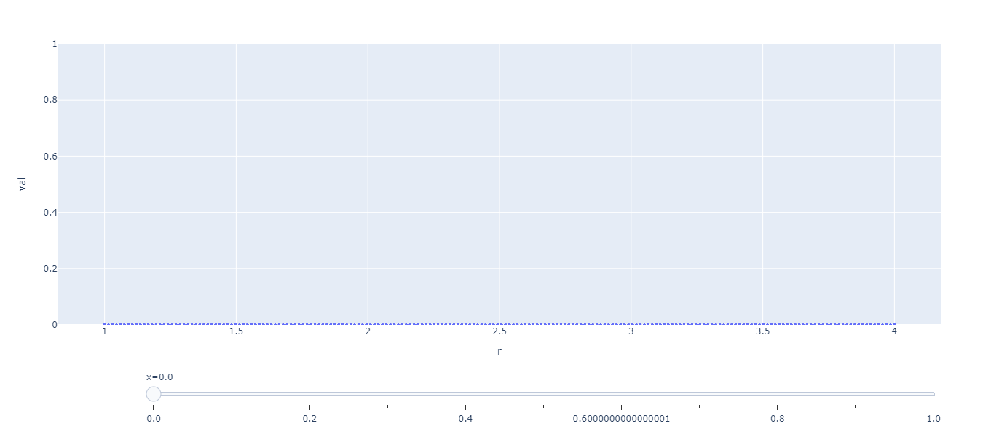

In [31]:
fig = px.scatter(df, x="r", y="val", 
                 animation_frame="x", 
                 range_y=[0, 1], 
                 height=600)

fig.update_traces(marker=dict(size=3))

fig["layout"].pop("updatemenus")
fig.show()

Widzimy, że dla dowolnego 0<x<1 diagram bifurkacyjny wygląda podobnie. Dla r > 3.7 zauważyć można, że w zależności od x punkty chaotycznie zmieniają położenie.

##### b) Dla tych samych wartości x0 oraz r (3.75 <= r <= 3.8) porównaj trajektorie obliczone z użyciem pojedynczej i podwójnej precyzji. Wyjaśnij otrzymane wyniki

In [32]:
num_of_points_per = 10
num_of_Rs = 200
num_of_Xs = 10

In [33]:
Xs = np.linspace(0.1, 0.9, num_of_Xs+1)
Rs = np.linspace(3.75, 3.8, num_of_Rs)

args = np.tile(np.array([np.tile(Xs, len(Rs)), np.repeat(Rs, len(Xs))]), num_of_points_per) 
vals_single = get_x_values(np.tile(Xs, len(Rs)), np.repeat(Rs, len(Xs)))

Xs = np.float32(Xs)
Rs = np.float32(Rs)
vals_double = get_x_values(np.tile(Xs, len(Rs)), np.repeat(Rs, len(Xs)))

df_single = pd.DataFrame(np.concatenate((args, vals_single.reshape(1,-1))).T, columns=["x", "r", "val"])
df_single['precision'] = 'single'

df_double = pd.DataFrame(np.concatenate((args, vals_double.reshape(1,-1))).T, columns=["x", "r", "val"])
df_double['precision'] = 'double'

df = pd.concat([df_single, df_double])

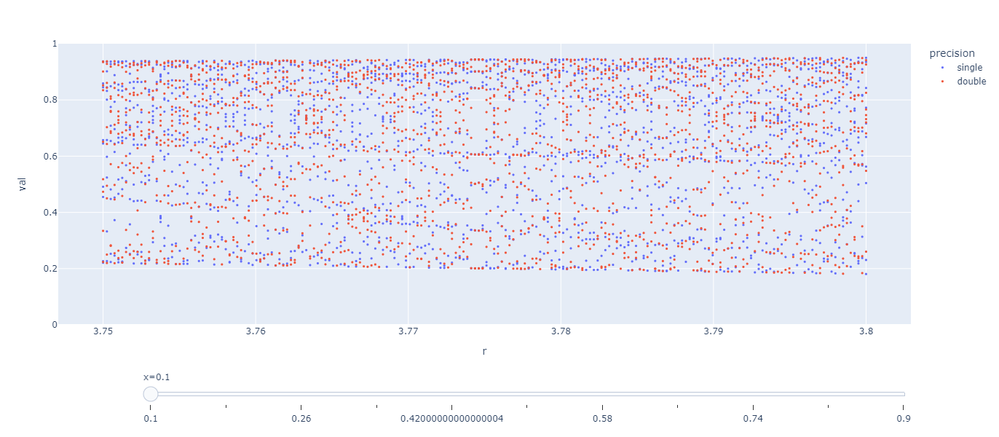

In [34]:
fig = px.scatter(df, x="r", y="val", color="precision",
                 animation_frame="x", 
                 range_y=[0, 1], 
                 height=600)

fig.update_traces(marker=dict(size=3))

fig["layout"].pop("updatemenus")
fig.show()

Mimo, że do obliczenia wyników użyto tych samych wartości **r** i **x0**, pojedynczej innej precyzji sprawiło, że punkty rozrzucone są totalnie inaczej.

##### c) Dla r = 4 i różnych wartości x0 wyznacz (pojedyncza precyzja) liczbę iteracji potrzebnych do osiągnięcia zera. Przedstaw interpretację rezultatów

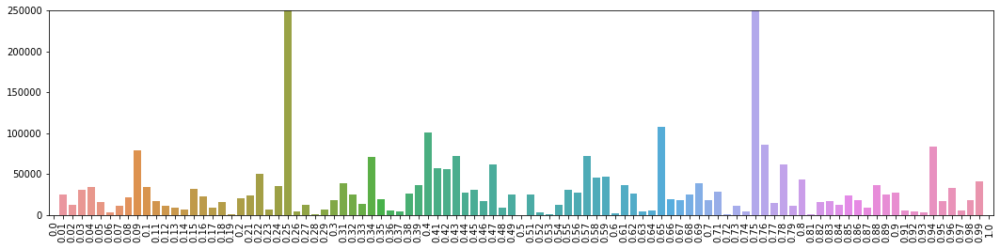

In [35]:
Xs = np.float32(np.linspace(0, 1, 101))

def iterations_till_0(x):
    for i in range(260000):
        if x<1e-8:
            return i
        x=4*x*(1-x)
    return i
        
Y = [iterations_till_0(x) for x in Xs]

plt.figure(figsize=(18,4))
sns.barplot(x=Xs, y=Y)
plt.xticks(rotation=90)
plt.ylim(0,250000)
plt.show()

Widzimy, że dla większości wartości **x0**, ciąg zbiega się do zera (xn < 1e8). Nie widzę tu żadnej regularności, oprócz faktów, że dla **x0 = 0.25** oraz **x0 = 0.75** ciąg nigdy nie zbiegnie do zera, będzie naprzemiennie przyjmował wartości 0.25 i 0.75. Dla **x0 = 0.5** ciąg najszybciej zbiega się do 0, bo już **x2 = 0**.